## Basic testing of the analysis package

In [1]:
from xraycam.nbinit import *

In [2]:
from xraycam import detconfig

In [3]:
camcontrol.set_detector('zwo')

xraycam.camcontrol.make_DataRun.<locals>._DataRun

In [4]:
dr = camcontrol.DataRun(decluster = False)
#dr = camcontrol.DataRun(threshold = 10, window_min = 41, window_max = 42, decluster = False)

In [5]:
dr.stop()

In [6]:
plt.imshow(dr.get_array())

<IPython.core.display.Javascript object>


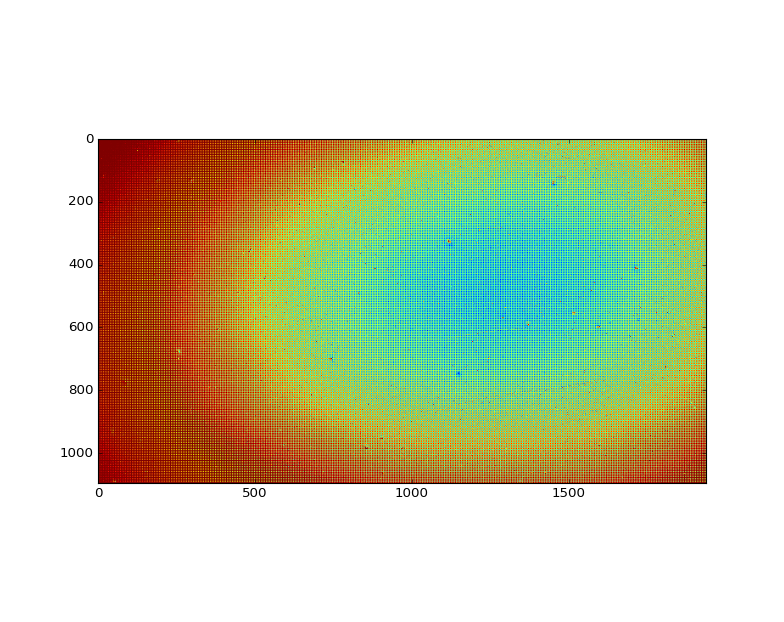

In [7]:
plt.show()

In [8]:
dr.acquisistion_time()

0.9045560359954834

In [10]:
dr.counts_per_second()

174147318.58421242

In [11]:
frame = dr.get_frame()

In [13]:
frame.plot_lineout()

array([ 105581.33333333,  101173.42222222,  105581.33333333, ...,
         74962.57777778,   92813.26666667,   75109.37777778])

In [12]:
frame.plot_histogram()

### The following pattern still works but is deprecated (as of 6/10/2016) because there's no longer a need to takemultiple data runs at once:

In [12]:
camcontrol.set_detector('beaglebone')

xraycam.camcontrol.make_DataRun.<locals>._DataRun

In [2]:
frame, lineout = runset_merge_plot('data/5.16.counts_0', gain = '0x3f',
        numExposures = 12000, run = False, window_min = 31, window_max = 55,
        threshold_min = 31, threshold_max = 55, rebin = 1, smooth = 10, error_bars = False)

### Do this instead

In [3]:
datarun, frame = datarun_and_frame('data/8.33.test3', gain = '0x3f',
        htime = '5s', run = True, window_min = 31, window_max = 55,
        rebin = 1, smooth = 10, error_bars = False,
        photon_value = 45., lineout = True, post_filter = True)

screen -d -m bash -c 'time sudo ./main_mt9m001 15 -o data/8.33.test3 -n 50 -g 0x3f -w 100 -r 31 55 -p >> xraycam.log '


#### How many photons per second? (note photon_value = 45 in the above call)

In [4]:
datarun.counts_per_second()

0.0

### Plot the histogram of pixel values:

In [5]:
histo = frame.plot_histogram()

### This call should raise a ValueError, indicating that there already exists a run with the given prefix:

In [7]:
frame, lineout = runset_and_merge('data/blah2', 80, run = True, update_interval = 40)

ValueError: Data file: data/blah2sum.dat already exists. Please choose a different run prefix.

In [2]:
datarun, frame = datarun_and_frame('data/6.14.mask2', gain = '0x3f',
        htime = '3m', run = False, window_min = 31, window_max = 55,
        rebin = 1, smooth = 10, error_bars = False,
        photon_value = 45., lineout = False, post_filter = True)

<IPython.core.display.Javascript object>


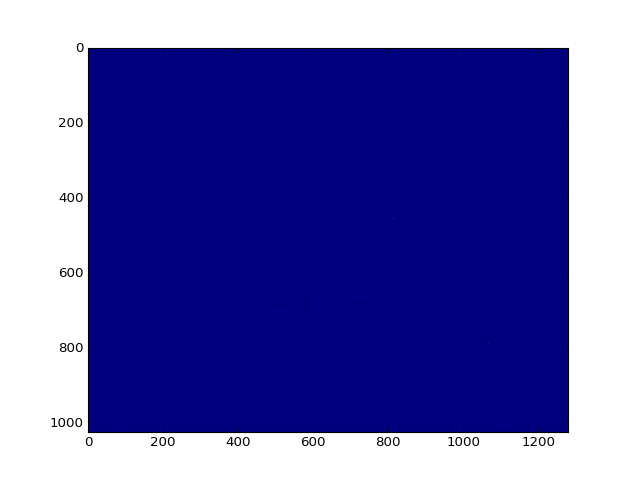

In [4]:
datarun.show()

In [5]:
datarun.counts_per_second()

2.7293827160493822

In [2]:
salpha6=camcontrol.DataRun('data/6.16.skalpha6', gain = '0x3f',
        htime = '2m', run = False, window_min = 30, window_max = 70, photon_value=57.)

In [40]:
salpha_width_study_druns = [camcontrol.DataRun('data/6.16.skalpha%d' % i, gain = '0x3f',
        htime = '2m', run = False, window_min = 30, window_max = 70, photon_value=57.)
                      for i in [3, 4, 5, 6]]

In [43]:
lineouts = [dr.get_frame().get_lineout(smooth = 5, xmax = 1000)[1] for dr in salpha_width_study_druns]
fwhm = list(map(lambda l: "FWHM: {:.4f}".format(fwhm(l)), lineouts))

salpha_width_study_lineouts = [dr.plot_lineout(peaknormalize = True, xmax = 1000, smooth = 5, show = False, label = l)
                               for dr, l in zip(salpha_width_study_druns, fwhm)]
plt.show()

/home/debian/am335x_pru_package-master/pru_sw/example_apps/BBBcam/mt9001_driver/data/6.16.skalpha3sum.dat not found. 
Searching for /home/debian/am335x_pru_package-master/pru_sw/example_apps/BBBcam/mt9001_driver/data/6.16.skalpha3sum.dat.part


In [2]:
camcontrol.DataRun

xraycam.bbb.DataRun

In [4]:
camcontrol.set_detector('zwo')